# "Исследование рынка заведений общественного питания Москвы для принятия решения об открытии нового заведения"

**Цель:** Исследовать рынок общественного питания Москвы на основе открытых данных.


**Описание:** Для принятия решения об открытии нового заведения провел исследование рынка общественного питания Москвы. В ходе исследования выделил популярные форматы заведения, рейтинги разных заведений и конкуренцию в городе. Определил потенциал в разных районах для популярных форматов. На основе данных сделал выводы, написал рекомендации и подготовил презентацию.

---
Для исследования использовал данные сервисов Яндекс Карты и Яндекс Бизнес с актуализацией на лето 2022 года.

---
В работе использовал библиотеки pandas, plotly, folium, json, matplotlib

---
**Презентация по ссылке:**<code>[Презентация результатов исследования](https://disk.yandex.ru/d/FHEuczJaBX0e_Q)
</code>

### Содержание проекта

[1. Загрузка и изучение данных](#загрузка)

[2. Подготовка данных](#подготовка_данных)

[3. Анализ данных](#анализ_данных)
- [3.1. Категории заведений](#категории)
- [3.2. Количество посадочных мест по категориям](#категории_места)
- [3.3. Соотношение сетевых и несетевых заведений](#сетевые)
- [3.4. Сетевые заведения по категориям](#категории_сетевые)
- [3.5. ТОП-15 заведений Москвы](#топ-15)
- [3.6. Заведения по районам](#районы_заведения)
- [3.7. Распределение средних рейтингов по категориям](#рейтинг_категория)
- [3.8. Карта со средним рейтингом заведений для каждого района](#карта_район_рейтинг)
- [3.9. Все заведения на карте](#заведения_на_карте)
- [3.10. Найдём топ-15 улиц по количеству заведений](#топ_15_улиц)
- [3.11. Улицы с одним заведением](#улицы_одно_заведение)
- [3.12. Средняя стоимость заказа по районам](#цена_райнон)

[4. Открытие кофейни](#открытие_кофейни)

In [1]:
# подключим необходимые библиотеки

import pandas as pd
import plotly.express as px
import plotly.graph_objects as go
import seaborn as sns
from folium import Map, Marker, Choropleth
from folium.plugins import MarkerCluster
import json
import matplotlib.pyplot as plt
from plotly.subplots import make_subplots


### <a id='загрузка'>1. Загрузка и изучение данных</a>

Ответим на вопросы:
- Сколько заведений представлено?
- Что можно сказать о каждом столбце датасета?
- Значения какого типа хранят столбцы? 

In [2]:
# загрузим данные

try:
    data = pd.read_csv('moscow_places.csv')
except:
    data = pd.read_csv('/datasets/moscow_places.csv')

In [3]:
# выведем общую информацию о датасете

data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


**Промежуточный итог:**

- В датасете 8406 записи, можем предположить что это число равно числу заведений. В дальнейшем проверим на дубликаты и поработаем с пропусками, возможно, скорректируем это число
- В некоторых столбцах видим значительное число пропусков. В дальнейшем посмотрим какие из них можно удалить, какие заполнить, какие оставить без изменений
- В некоторых столбцах некорректный тип данных

### <a id='подготовка_данных'>2. Подготовка данных</a>
- Посмотрим дубликаты явные и неявные
- Изучим пропуски
- Поменяем тип данных
- Создадим столбец 'street' с названием улиц
- Создадим столбец 'is_24/7' о графике работы

**Найдём явные и неявные дубликаты**

In [4]:
# посчитаем количество явных дубликатов

data.duplicated().sum()

0

- Явных дубликатов нет, но могут быть неявные. Появление неявных дубликатов может быть связанно с разным регистром, написанием названия ресторана, адреса и т.п.
- Будем искать неявные дубликаты. Если у заведений одна категория, один район, координаты и рейтинг, то вероятно это одно и тоже заведение. Так мы найдём неявные дубликаты и удалим их.

In [5]:
# сделаем срез по выделлынм столбцам и посчитаем дубликаты

data[['category', 'district', 'lat', 'lng', 'rating']].duplicated().sum()

3

In [6]:
# удалим найденые дубликаты по индексам строк

data = data.drop(data[data[['category', 'district', 'lat', 'lng', 'rating']].duplicated()].index, axis=0)

**Изучим пропуски**

In [7]:
# найдем долю пропусков в столбцах с пропусками

print('Доля пропуска в столбцах:')
print('hours - Время работы', round(data['hours'].isna().sum() / len(data) * 100,2), '%')
print('price - Категория цен', round(data['price'].isna().sum() / len(data) * 100,2), '%')
print('avg_bill - Средняя стоимость заказа', round(data['avg_bill'].isna().sum() / len(data) * 100,2), '%')
print('middle_avg_bill - Средний чек', round(data['middle_avg_bill'].isna().sum() / len(data) * 100,2), '%')
print('middle_coffee_cup - Одна чашка капучино', round(data['middle_coffee_cup'].isna().sum() / len(data) * 100,2), '%')
print('seats - Количество посадочных мест', round(data['seats'].isna().sum() / len(data) * 100,2), '%')

Доля пропуска в столбцах:
hours - Время работы 6.38 %
price - Категория цен 60.55 %
avg_bill - Средняя стоимость заказа 54.59 %
middle_avg_bill - Средний чек 62.53 %
middle_coffee_cup - Одна чашка капучино 93.63 %
seats - Количество посадочных мест 42.96 %


Изучим пропуски и примем решение что делать
- Столбец 'hours' - 6% пропусков от всего количества, оставим и заполним значением "нет данных"
- Столбец 'price' - 60.55% пропусков, тип данных текстовый. Заменить пропуски нет возможности, поэтому для удобства заполним значением "нет данных"
- Столбец 'avg_bill' - 54,59%, тип данных текстовый. Для удобства заменим пропуски значением "нет данных"
- Столбец 'middle_avg_bill' - 62.53%, тип данных числовой. Не будем заполнять медианным значением, а заполним "заглушкой"
- Столбец 'middle_coffee_cup' - 93.53%, очень много пропусков. Не будем заполнять медианным значением, а заполним "заглушкой"
- Столбец 'seats' - 42.96% пропусков. Количество посадочных мест в разных заведениях может быть разным, поэтому также поставим "заглушку"

In [8]:
# заполним пропуски значением "нет данных"
data['hours']= data['hours'].fillna('нет данных')

In [9]:
# для текстовых столбцов вместо пропуска напишем 'нет данных'

data['price'] = data['price'].fillna('нет данных')

data['avg_bill'] = data['avg_bill'].fillna('нет данных')

In [10]:
# заполним пропуски в столбце 'middle_avg_bill' значением -100

data['middle_avg_bill'] = data['middle_avg_bill'].fillna(-100)

In [11]:
# заполним пропуски в столбце 'middle_coffee_cup' значением -100

data['middle_coffee_cup'] = data['middle_coffee_cup'].fillna(-100)

In [12]:
# заполним пропуски в столбце 'seats' значением -100

data['seats'] = data['seats'].fillna(-100)

In [13]:
# посмотрим на датафрейм

data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8403 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8403 non-null   object 
 1   category           8403 non-null   object 
 2   address            8403 non-null   object 
 3   district           8403 non-null   object 
 4   hours              8403 non-null   object 
 5   lat                8403 non-null   float64
 6   lng                8403 non-null   float64
 7   rating             8403 non-null   float64
 8   price              8403 non-null   object 
 9   avg_bill           8403 non-null   object 
 10  middle_avg_bill    8403 non-null   float64
 11  middle_coffee_cup  8403 non-null   float64
 12  chain              8403 non-null   int64  
 13  seats              8403 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 984.7+ KB


**Поменяем тип данных**

In [14]:
# изменим тип данных в столбце 'chain'

data['chain'] = data['chain'].astype(bool)

**Создадим столбец 'street' с названием улиц**

In [15]:
# выведем столбец с адресом
# чтоб понять как записаны улицы и как их извлечь

data['address'].head()

0             Москва, улица Дыбенко, 7/1
1     Москва, улица Дыбенко, 36, корп. 1
2         Москва, Клязьминская улица, 15
3    Москва, улица Маршала Федоренко, 12
4        Москва, Правобережная улица, 1Б
Name: address, dtype: object

Видим что название улицы заключено между двумя запятыми. Можем разделить строку на части методом split разделитель ','. Тогда нам потребуется второй элемент списка. Напишем функцию для извлечения улицы.

In [16]:
# функция для извлечения второго элемента списка

def extract_street(x):
    street_str = x.split(',')
    street_str[1]
    return street_str[1]

In [17]:
# применим функцию и сохраним результат в столбец 'street'

data['street'] = data['address'].apply(extract_street)

In [18]:
# проверим результат работы функции

data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,нет данных,нет данных,-100.0,-100.0,False,-100.0,улица Дыбенко
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,-100.0,False,4.0,улица Дыбенко
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,-100.0,False,45.0,Клязьминская улица
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,нет данных,Цена чашки капучино:155–185 ₽,-100.0,170.0,False,-100.0,улица Маршала Федоренко
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,-100.0,True,148.0,Правобережная улица


**Обозначим какие заведения работают круглосуточно и ежедневно**

В столбце с графиком работы 'hours' будем искать значение 'ежедневно' и 'круглосоточно'. Если оба значения есть, то будем записывать 'True' в столбец 'is_27/7', если хотя бы одного значения нет - запишем 'False'

In [19]:
# функция для нахождения значений 'ежедневно' и 'круглосуточно'
# возвращает 'True' или 'False'

def find_24_7(x):
    if x.find('ежедневно') != -1 and x.find('круглосуточно') != -1:
        result = True
    else:
        result = False
    return result

In [20]:
# применим функцию и запишем результат в столбец 'is_27/7'

data['is_24/7'] = data['hours'].apply(find_24_7)

In [21]:
# проверим результат работы функции

data['is_24/7'].value_counts()

False    7674
True      729
Name: is_24/7, dtype: int64

In [22]:
# так как удаляли строки, сбросим индексы

data = data.reset_index(drop=True)

data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,нет данных,нет данных,-100.0,-100.0,False,-100.0,улица Дыбенко,False
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,-100.0,False,4.0,улица Дыбенко,False
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,-100.0,False,45.0,Клязьминская улица,False
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,нет данных,Цена чашки капучино:155–185 ₽,-100.0,170.0,False,-100.0,улица Маршала Федоренко,False
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,-100.0,True,148.0,Правобережная улица,False


**Промежуточный итог:**
- Явных дубликатов нет
- Удалили 3 неявных дубликата
- В столбцах заполнение значениями приведёт к искажению результата, оставили данные как есть. Вместо пропусков поставили "заглушку" - значение '-100'. Это сделали чтоб не удалять данные, но учитывать при дельнейших рассчётах
- Поменяли тип данных в одном столбце, согласно описанию датафрейма
- Добавили столбец 'street' с названием улицы, на котором расположено заведение
- Добавили столбец 'is_24/7', в котором обозначили работает ли заведение еждневно и круглосуточно

### <a id='анализ_данных'>3. Анализ данных</a>

<a id='категории'>3.1. Категории заведений</a>

Определим категории заведений, построим визуализацию и сделаем вывод о распределении о распределении заведений по категориям.

Чтоб показать доли заведений в тех или иных категориях построим круговую диаграмму.

Исключим из исследования данные, где были пропуски.

In [23]:
# исключим из исследования значения с пропусками

data_category = data.query('category != "нет данных"').copy()

# сгруппируем данные по категории, посчитаем и отсортируем

data_category = data_category.groupby('category').count().sort_values(by='name')

data_category

,name,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
category,,,,,,,,,,,,,,,
булочная,256,256,256,256,256,256,256,256,256,256,256,256,256,256,256
столовая,315,315,315,315,315,315,315,315,315,315,315,315,315,315,315
быстрое питание,603,603,603,603,603,603,603,603,603,603,603,603,603,603,603
пиццерия,633,633,633,633,633,633,633,633,633,633,633,633,633,633,633
"бар,паб",765,765,765,765,765,765,765,765,765,765,765,765,765,765,765
кофейня,1413,1413,1413,1413,1413,1413,1413,1413,1413,1413,1413,1413,1413,1413,1413
ресторан,2041,2041,2041,2041,2041,2041,2041,2041,2041,2041,2041,2041,2041,2041,2041
кафе,2377,2377,2377,2377,2377,2377,2377,2377,2377,2377,2377,2377,2377,2377,2377


In [24]:
# построим столбчату диаграмму с указанием долей тех или иных заведений

fig = px.bar(data_category,
             x=data_category.index,
             y='name',
             title='Распределение заведений по категориям',
             labels={'name':'Количество заведений', 'category':'Категории заведений'},
             color_discrete_sequence=px.colors.sequential.RdBu,
             width=730,
             height=600)

fig.show()

**Промежуточный итог:**
- Самые распространеные, популярные заведения - это *рестораны* и *кафе*. Они составляют половину всех заведений общепита
- Меньше всего представлены *столовые* и *булочные*
- Вероятно в сегменте ресторанов и кафе конкуренция будет значительно выше, чем в сегменте столовых и булочных

<a id='категории_места'>3.2. Количество посадочных мест по категориям</a>

Посмотрим на количество посадочных мест по категориям. Построим визуализацию и сделаем выводы.

Построим столбчатую диаграмму, чтоб показать распределение посадочных мест по категориям

Исключим значения с пропусками

In [25]:
# исключим значения с пропусками, которые помечали '-100'

data_category_seats = data_category.query('seats != -100').copy()

In [26]:
# сгрупируем по категориям заведения и найдём медиану посадочных мест
data_category_seats = data_category_seats.groupby(by='category').median().sort_values(by='seats')

data_category_seats

,name,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
category,,,,,,,,,,,,,,,
булочная,256.0,256.0,256.0,256.0,256.0,256.0,256.0,256.0,256.0,256.0,256.0,256.0,256.0,256.0,256.0
столовая,315.0,315.0,315.0,315.0,315.0,315.0,315.0,315.0,315.0,315.0,315.0,315.0,315.0,315.0,315.0
быстрое питание,603.0,603.0,603.0,603.0,603.0,603.0,603.0,603.0,603.0,603.0,603.0,603.0,603.0,603.0,603.0
пиццерия,633.0,633.0,633.0,633.0,633.0,633.0,633.0,633.0,633.0,633.0,633.0,633.0,633.0,633.0,633.0
"бар,паб",765.0,765.0,765.0,765.0,765.0,765.0,765.0,765.0,765.0,765.0,765.0,765.0,765.0,765.0,765.0
кофейня,1413.0,1413.0,1413.0,1413.0,1413.0,1413.0,1413.0,1413.0,1413.0,1413.0,1413.0,1413.0,1413.0,1413.0,1413.0
ресторан,2041.0,2041.0,2041.0,2041.0,2041.0,2041.0,2041.0,2041.0,2041.0,2041.0,2041.0,2041.0,2041.0,2041.0,2041.0
кафе,2377.0,2377.0,2377.0,2377.0,2377.0,2377.0,2377.0,2377.0,2377.0,2377.0,2377.0,2377.0,2377.0,2377.0,2377.0


In [27]:
# построим столбчатую диаграмму

fig = px.bar(data_category_seats,
             x=data_category_seats.index, y='seats', 
             title='Распределение медианного количества посадочных мест по категориям',
             labels={'seats':'Медиана посадочных мест', 'category':'Категории заведений'},
             color_discrete_sequence=px.colors.sequential.RdBu,
             width=730,
             height=600)

fig.show()

**Промежуточный итог:**
- Больше всего посадочных мест в ресторанах и кафе
- Меньше всего в булочных и столовых
- Среднее количество в кафе, столовых и в заведения быстрого питания
- Для ресторана требуется больше площадь для посадочных мест, чем в булочной и пиццерии. Что может сказаться на аренде помещения

<a id='сетевые'>3.3. Соотношение сетевых и несетевых заведений</a>

Посмотрим каких заведений больше: сетевых и несетевых

Для этого используем круговую диаграмму

In [28]:
# построим круговую диаграмму

fig = px.pie(data,
             names='chain',
             title='Соотношение сетевых и несетевых заведений',
             color_discrete_sequence=px.colors.sequential.RdBu,
             width=600,
             height=600)

fig.update_traces(textinfo='percent', textfont_size=20)

fig.show()

**Промежуточный итог:**
- Несетевых заведений больше чем сетевых

<a id='категории_сетевые'>3.4. Сетевые заведения по категориям</a>

Посмотрим заведения какой категории чаще являются сетевыми

Возьмём основной датасет и исключим из него данные с пропусками

Чтоб сравнить данные в категориях используем столбчатую гистограмму

In [29]:
# исключим пропуски

data_category_chain = data.query('category != "нет данных"').copy()

# создадим сводную таблицу
# посчитаем сколько сетевых и несетевых в каждой категории

data_category_chain = data_category_chain.pivot_table(index='category',
                                values='name',
                                columns='chain', 
                                aggfunc='count').sort_values(by=True).reset_index()

In [30]:
# переименуем столбцы

data_category_chain = data_category_chain.rename(columns={False:'not_chain',True:'chain'})

In [31]:
# посчитаем доли сетевых и несетевых заведений
# сохраним в соответсвующие столбцы

data_category_chain['percent_not_chain'] = data_category_chain['not_chain'] / data_category_chain[['not_chain','chain']].sum(axis=1)

data_category_chain['percent_chain'] = data_category_chain['chain'] / data_category_chain[['not_chain','chain']].sum(axis=1)

data_category_chain = data_category_chain.sort_values(by='percent_not_chain')

data_category_chain

chain,category,not_chain,chain,percent_not_chain,percent_chain
1,булочная,99,157,0.386719,0.613281
4,пиццерия,303,330,0.478673,0.521327
5,кофейня,693,720,0.490446,0.509554
3,быстрое питание,371,232,0.615257,0.384743
6,ресторан,1313,728,0.643312,0.356688
7,кафе,1598,779,0.672276,0.327724
0,столовая,227,88,0.720635,0.279365
2,"бар,паб",596,169,0.779085,0.220915


In [32]:
# построим столбчатую гистограмму по категориям

fig = px.histogram(data_category_chain, 
             x='category',
             y=['percent_not_chain','percent_chain'],
             barmode='group',
             labels={'sum of value':'Доля заведений', 'category':'Категория заведения'},
             title='Доля сетевых и несетевых заведений по категориям',
             color_discrete_sequence=px.colors.sequential.RdBu)

fig.show()

**Промежуточный итог:**
- Процент сетевых заведений выше у булочных, пиццерий и кофеин
- Соотношение сетевых и несетевых в булочных, пиццериях и кофейня в пользу сетевых заведений
- Бары и столовые наоборт чаще всего несетевые

<a id='топ-15'>3.5. ТОП-15 заведений Москвы</a>
- Найдём топ-15 сетевых заведений Москвы
- Построим график для отображения этих заведений
- Выясним к кактегории относятся заведения

In [33]:
# возьмём только сетевые заведения и без пропусков в категории

data_top_15 = data.query('chain==1 and category!="нет данных"')

# сгрупируем по названию и категории заведения
# посчитаем количество заведений
# отсортируем по возрастанию и выведем первые 15

data_top_15 = pd.DataFrame(
    data_top_15.pivot_table(index=['name','category'], values='address', aggfunc='count')
    .sort_values(by='address', ascending=False).head(15)).reset_index()

# переименуем столбцы
data_top_15 = data_top_15.rename(columns={'address':'count'})

data_top_15

,name,category,count
0,Шоколадница,кофейня,119
1,Домино'с Пицца,пиццерия,76
2,Додо Пицца,пиццерия,74
3,One Price Coffee,кофейня,71
4,Яндекс Лавка,ресторан,69
5,Cofix,кофейня,65
6,Prime,ресторан,49
7,КОФЕПОРТ,кофейня,42
8,Кулинарная лавка братьев Караваевых,кафе,39
9,Теремок,ресторан,36


In [34]:
fig = px.histogram(data_top_15, 
             x='name',
             y='count',
             labels={'sum of value':'Доля заведений', 'name':'Название заведения'},
             title='ТОП-15 заведений Москвы',
             width=900,
             height=700,
             color_discrete_sequence=px.colors.sequential.RdBu)

fig.show()

In [35]:
# посмотрим каких категорий больше

data_top_15['category'].value_counts()

кофейня     6
ресторан    3
кафе        3
пиццерия    2
булочная    1
Name: category, dtype: int64

**Промежуточный итог:**
- Самая популярная категоря - кофейни
- На первом месте среди заведений - Шоколадница

<a id='районы_заведения'>3.6. Заведения по районам</a>
- Найдем все районы, которые представлены в датасете
- Найдем общее число заведений по районам
- Найдем количество заведений каждой категории по районам


In [36]:
# найдем все районы, которые представлены в датасете

data['district'].unique()

array(['Северный административный округ',
       'Северо-Восточный административный округ',
       'Северо-Западный административный округ',
       'Западный административный округ',
       'Центральный административный округ',
       'Восточный административный округ',
       'Юго-Восточный административный округ',
       'Южный административный округ',
       'Юго-Западный административный округ'], dtype=object)

In [37]:
# сгрупируем по районам и посчитаем число заведений

data.groupby(by='district').count()['name'].sort_values(ascending=False)

district
Центральный административный округ         2242
Северный административный округ             898
Южный административный округ                892
Северо-Восточный административный округ     891
Западный административный округ             851
Восточный административный округ            797
Юго-Восточный административный округ        714
Юго-Западный административный округ         709
Северо-Западный административный округ      409
Name: name, dtype: int64

In [38]:
# сгрупируем данные по районам и категориям

distric_category_counts = data.groupby(['district', 'category']).count()['name'].sort_values(ascending=False).reset_index()
distric_category_counts = distric_category_counts.rename(columns={'name':'count'})
distric_category_counts

,district,category,count
0,Центральный административный округ,ресторан,670
1,Центральный административный округ,кафе,464
2,Центральный административный округ,кофейня,428
3,Центральный административный округ,"бар,паб",364
4,Юго-Восточный административный округ,кафе,282
...,...,...,...
67,Северо-Западный административный округ,"бар,паб",23
68,Северо-Западный административный округ,столовая,18
69,Юго-Западный административный округ,столовая,17
70,Юго-Восточный административный округ,булочная,13


In [39]:
# построим столбчатую гистограмму по категориям

fig = px.bar(distric_category_counts,
             x="district",
             y="count",
             color="category",
             width=900,
             height=800,
             title='Распределение категорий заведений по районам города',
             labels={'count':'Количество заведений', 'district':'Район города'},
             color_discrete_sequence=px.colors.sequential.RdBu)

fig.update_layout(xaxis={'categoryorder':'total descending'}) 

fig.show()

**Промежуточный итог:**
- Больше всего заведений в Центральном административном округе - 2242
- Самое маленькое количество заведений в Северо-Западный административный округ - 409
- В остальных округах заведения распределены равномерно
- Во всех районах большую часть составляют Рестораны, Кафе и Кофейни


<a id='рейтинг_категория'>3.7 Распределение средних рейтингов по категориям</a>
- Визуализируем распределение средних рейтингов по категориям. Для более корректного расчёта среднего рейтинга будем использовать медианное значение
- Посмотрим на отличия рейтингов в различных типах общепита

In [40]:
# сгрупируем по категориям и найдем медиану для рейтинга
# сохраним в переменну 'rating_avg'

rating_avg = pd.DataFrame(data.groupby('category').mean()['rating'].sort_values(ascending=False).sort_values(ascending=False))

rating_avg

,rating
category,
"бар,паб",4.387712
пиццерия,4.301264
ресторан,4.290348
кофейня,4.277282
булочная,4.268359
столовая,4.211429
кафе,4.123938
быстрое питание,4.050249


In [41]:
# визуализируем рейтинги

fig = px.histogram(rating_avg,
             x=rating_avg.index,
             y=rating_avg['rating'],
             labels={'rating':'Средний рейтинг', 'category':'Категория заведения'},
             title='Распределение среднего рейтинга заведений по категориям',
             range_y=[4, 4.5],
             color_discrete_sequence=px.colors.sequential.RdBu)

fig.show()

**Промежуточный итог:**
- Средний рейтинг заведений по категориям отличается не сильно
- Самый высокий средний рейтинг в категории "бар, паб"
- Самый низкий рейтинг у заведений "быстрое питание"
- Отличия не значительный, значит можно сказать "заведения в любой категории может пользоваться спросом и иметь высокий рейтинг"

<a id='карта_район_рейтинг'>3.8. Карта со средним рейтингом заведений для каждого района</a>
- Найдем средний рейтинг заведений по районам
- Построим карту со срденим рейтингом заведений по районам Москвы

In [42]:
# сгруппируем данные по районам
# посчитаем средний рейтинг

median_rating_district = data.groupby('district').mean('rating')

median_rating_district

,lat,lng,rating,middle_avg_bill,middle_coffee_cup,chain,seats,is_24/7
district,,,,,,,,
Восточный административный округ,55.782867,37.759065,4.174404,200.329987,-85.559598,0.355082,-3.909661,0.120452
Западный административный округ,55.716577,37.479416,4.181551,314.673325,-82.982374,0.441833,43.404230,0.084606
Северный административный округ,55.827239,37.526710,4.239644,268.600223,-77.269488,0.384187,34.206013,0.079065
Северо-Восточный административный округ,55.845788,37.623556,4.148260,175.869809,-82.132435,0.374860,12.682379,0.084175
Северо-Западный административный округ,55.813534,37.450132,4.208802,254.007335,-84.716381,0.381418,27.427873,0.105134
Центральный административный округ,55.754912,37.618447,4.377520,510.401873,-78.660571,0.390277,16.665923,0.058430
Юго-Восточный административный округ,55.694097,37.749872,4.101120,104.894958,-87.707283,0.308123,-10.739496,0.130252
Юго-Западный административный округ,55.660422,37.542107,4.172920,195.842031,-86.005642,0.425952,17.077574,0.102962
Южный административный округ,55.654432,37.652342,4.184417,228.924888,-86.704036,0.349776,33.433857,0.084081


In [43]:
# читаем файл и сохраняем в переменной
try:
    with open('admin_level_geomap.geojson', 'r', encoding='utf-8') as f:
        geo_json = json.load(f)
except:
    with open('/datasets/admin_level_geomap.geojson', 'r', encoding='utf-8') as f:
        geo_json = json.load(f)
    
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=geo_json,
    data=median_rating_district,
    columns=[median_rating_district.index, 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Медианный рейтинг заведений по районам',
).add_to(m)

# выводим карту
m

**Промежуточный итог**
- Самый высокий средний рейтинг в Центрально административном округ
- Самый низкий в Северо-Восточном и Юго-восточном административных округах

<a id='заведения_на_карте'>3.9. Все заведения на карте</a>
- Отобразим все заведения на карте

In [44]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
data.apply(create_clusters, axis=1)

# выводим карту
m

<a id='топ_15_улиц'>3.10. Найдём топ-15 улиц по количеству заведений</a>
- Найдем топ-15 улиц по количеству заведений
- Построим график распределения количества заведений и их категорий по этим улицам
- Проиюлюстрируем одним графиком

In [45]:
# сделаем сводную таблицу по улицам и категориям с количеством заведений

data_street_category = pd.DataFrame(data.pivot_table(index='street', columns='category', values='name', aggfunc='count'))

# сбросим индекс
#data_street_category = data_street_category.reset_index()

data_street_category

category,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая
street,,,,,,,,
1-й Автозаводский проезд,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN
1-й Балтийский переулок,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN
1-й Варшавский проезд,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN
1-й Вешняковский проезд,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN
1-й Волоколамский проезд,NaN,NaN,NaN,1.0,1.0,NaN,1.0,NaN
...,...,...,...,...,...,...,...,...
улица Юности,NaN,NaN,NaN,4.0,NaN,NaN,NaN,NaN
улица Юных Ленинцев,2.0,NaN,NaN,4.0,1.0,3.0,5.0,NaN
улица Яблочкова,NaN,1.0,NaN,NaN,1.0,NaN,1.0,NaN


Видим пропуски, значи на этих улицах нет заведений. Заполним пропуски нулями

In [46]:
# заполним пропуски значением 0

data_street_category = data_street_category.fillna(0)

In [47]:
# создадим столбец в который сохраним общее число заведений на улице

data_street_category['sum_catering'] = data_street_category.sum(axis=1)

In [48]:
# найдем топ-15 улиц по количеству заведений
top_15_street = data_street_category.sort_values(by='sum_catering', ascending=False).head(15)

top_15_street = pd.DataFrame(top_15_street).drop('sum_catering', axis=1)

top_15_street

category,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая
street,,,,,,,,
проспект Мира,12.0,4.0,21.0,53.0,36.0,11.0,45.0,2.0
Профсоюзная улица,6.0,4.0,15.0,35.0,18.0,15.0,26.0,3.0
проспект Вернадского,7.0,1.0,12.0,25.0,16.0,12.0,33.0,2.0
Ленинский проспект,10.0,3.0,2.0,26.0,23.0,5.0,33.0,5.0
Ленинградский проспект,15.0,4.0,2.0,12.0,25.0,9.0,25.0,3.0
Дмитровское шоссе,6.0,2.0,10.0,23.0,11.0,8.0,24.0,4.0
Каширское шоссе,2.0,0.0,10.0,20.0,16.0,5.0,19.0,5.0
Варшавское шоссе,6.0,0.0,7.0,18.0,14.0,4.0,20.0,7.0
Ленинградское шоссе,5.0,2.0,5.0,13.0,13.0,3.0,26.0,3.0


In [49]:
# построим распределение категорий заведений по улицам

fig = px.bar(top_15_street, x=top_15_street.index,
             y=top_15_street.columns,
             labels={'value':'Количество заведений', 'street':'Улица'},
             title="Распределение категорий заведений по топ-15 улиц",
            color_discrete_sequence=px.colors.sequential.RdBu)
fig.show()

**Промежуточный итог:**
- Больше всего заведений расположено на проспекте Мира
- На топ-15 улиц больше расположены приемущественно рестораны, кафе и кофейни
- Соотношений категорий заведений примерно одинаково для каждой улицы из топ-15

<a id='улицы_одно_заведение'>3.11. Улицы с одним заведением</a>
- Найдем улицы с одним объектом общепита
- Посмотрим в каком районе больше улиц с одним заведением

In [50]:
# найдем улицы с одним заведением

one_on_street = pd.DataFrame(data_street_category[data_street_category['sum_catering'] == 1])

# сбросим индекс

one_on_street = one_on_street.reset_index()

one_on_street

category,street,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая,sum_catering
0,1-й Автозаводский проезд,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0
1,1-й Балтийский переулок,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0
2,1-й Варшавский проезд,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0
3,1-й Вешняковский проезд,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0
4,1-й Голутвинский переулок,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...
453,улица Шкулёва,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0
454,улица Шкулёва 4,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0
455,улица Шухова,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0
456,улица Юннатов,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0


In [51]:
# объединим таблицу с улицами на которых одно заведения
# c основной таблицей
# посмотрим в каких районах эти улицы с одним заведением

one_street_district = one_on_street.merge(data, on = 'street', how='left')[['street','district']].value_counts('district')

one_street_district = pd.DataFrame(one_street_district).reset_index()

one_street_district = one_street_district.rename(columns={0:'sum_one_catering'})

one_street_district

,district,sum_one_catering
0,Центральный административный округ,145
1,Северо-Восточный административный округ,55
2,Восточный административный округ,52
3,Северный административный округ,52
4,Южный административный округ,43
5,Юго-Восточный административный округ,39
6,Западный административный округ,35
7,Северо-Западный административный округ,19
8,Юго-Западный административный округ,18


In [52]:
# найдём общее число улиц

all_street_district = pd.DataFrame(data.value_counts('district')).reset_index()

all_street_district

,district,0
0,Центральный административный округ,2242
1,Северный административный округ,898
2,Южный административный округ,892
3,Северо-Восточный административный округ,891
4,Западный административный округ,851
5,Восточный административный округ,797
6,Юго-Восточный административный округ,714
7,Юго-Западный административный округ,709
8,Северо-Западный административный округ,409


In [53]:
# объеденим таблицы по району

district_catering = one_street_district.merge(all_street_district, on = 'district', how='left').rename(columns={0:'sum_all_catering'})

district_catering

,district,sum_one_catering,sum_all_catering
0,Центральный административный округ,145,2242
1,Северо-Восточный административный округ,55,891
2,Восточный административный округ,52,797
3,Северный административный округ,52,898
4,Южный административный округ,43,892
5,Юго-Восточный административный округ,39,714
6,Западный административный округ,35,851
7,Северо-Западный административный округ,19,409
8,Юго-Западный административный округ,18,709


In [54]:
# найдём долю улиц с одним заведением от общего числа улиц в районе
district_catering['percent'] = district_catering['sum_one_catering'] / district_catering['sum_all_catering']

district_catering

,district,sum_one_catering,sum_all_catering,percent
0,Центральный административный округ,145,2242,0.064674
1,Северо-Восточный административный округ,55,891,0.061728
2,Восточный административный округ,52,797,0.065245
3,Северный административный округ,52,898,0.057906
4,Южный административный округ,43,892,0.048206
5,Юго-Восточный административный округ,39,714,0.054622
6,Западный административный округ,35,851,0.041128
7,Северо-Западный административный округ,19,409,0.046455
8,Юго-Западный административный округ,18,709,0.025388


In [55]:
fig = px.pie(district_catering,
             names='district',
             values='percent',
             title='Доля улиц с одним заведением по районам',
             color_discrete_sequence=px.colors.sequential.RdBu,
             width=800,
             height=600)

fig.update_traces(textinfo='percent', textfont_size=20)

fig.show()

**Промежуточный итог:**
- Улицы с одним заведеним находятся во всех районах города
- Процент улиц с одним заведением больше всего в Восточном административном округе
- Меньше всего улиц с одним заведением в Западном административном округе

<a id='цена_райнон'>3.12. Средняя стоимость заказа по районам</a>
- Найдём среднюю стоимость заказа для каждого района
- Построим хороплет для каждого района
- Проанализируем цены в центрально округе и других
- Как удалённость от центра влияет на цену?

In [56]:
# исключим пропуски, где ставили "заглушки -100"

median_district_price = data.query('middle_avg_bill != -100')

median_district_price = median_district_price.reset_index(drop=True)

In [57]:
# сгрупируем по району и найдём медианну для района

median_district_price = pd.DataFrame(median_district_price.groupby('district').median()['middle_avg_bill']).reset_index()

median_district_price

,district,middle_avg_bill
0,Восточный административный округ,575.0
1,Западный административный округ,1000.0
2,Северный административный округ,650.0
3,Северо-Восточный административный округ,500.0
4,Северо-Западный административный округ,700.0
5,Центральный административный округ,1000.0
6,Юго-Восточный административный округ,450.0
7,Юго-Западный административный округ,600.0
8,Южный административный округ,500.0


In [58]:
# читаем файл и сохраняем в переменной
try:
    with open('admin_level_geomap.geojson', 'r', encoding='utf-8') as f:
        geo_json = json.load(f)
except:
    with open('/datasets/admin_level_geomap.geojson', 'r', encoding='utf-8') as f:
        geo_json = json.load(f)

# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=geo_json,
    data=median_district_price,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средняя стоимость заказа по районам',
).add_to(m)

# выводим карту
m

**Промежуточный итог:**
- Самые высокая средняя стоимость заказа в Центральном административном округе
- Чем дальше от центра - цена снижается

### <a id='открытие_кофейни'>4. Открытие кофейни</a>

Ответим на вопросы:
- Сколько всего кофеен в датасете?
- В каких районах их больше всего, каковы особенности их расположения?
- Есть ли круглосуточные кофейни?
- Какие у кофеен рейтинги? Как они распределяются по районам?
- На какую стоимость чашки капучино стоит ориентироваться при открытии и почему?

In [59]:
# посчитаем количество кофейн

print('Количество кофеин в Москве', data[data['category'] == 'кофейня']['category'].count())

Количество кофеин в Москве 1413


In [60]:
# сделаем срез по кофейням и сохраним

data_coffe = data[data['category'] == 'кофейня']

# сгруппируем по району и сохраним в новую переменную

data_coffe_district = pd.DataFrame(data_coffe.groupby('district').count()['name'].sort_values(ascending=False)).reset_index()

data_coffe_district

,district,name
0,Центральный административный округ,428
1,Северный административный округ,193
2,Северо-Восточный административный округ,159
3,Западный административный округ,150
4,Южный административный округ,131
5,Восточный административный округ,105
6,Юго-Западный административный округ,96
7,Юго-Восточный административный округ,89
8,Северо-Западный административный округ,62


In [61]:
fig = px.histogram(data_coffe_district,
             x='district',
             y='name',
             labels={'name':'Количество кофеин', 'district':'Районы города'},
             title='Количество кофейн в районах города',
             width=800,
             height=600,
             color_discrete_sequence=px.colors.sequential.RdBu)

fig.show()

In [62]:
# найдем круглосуточные кофейни

data_coffe['is_24/7'].value_counts()

False    1354
True       59
Name: is_24/7, dtype: int64

Круглосуточных кофейн - **59 штук**

In [63]:
# сгруппируем по району и посчитаем средний рейтинг кофеин

coffe_mean_rating = data_coffe.pivot_table(index='district', values='rating', aggfunc='mean')

coffe_mean_rating.sort_values(by='rating', ascending=False)

,rating
district,
Центральный административный округ,4.336449
Северо-Западный административный округ,4.325806
Северный административный округ,4.291710
Юго-Западный административный округ,4.283333
Восточный административный округ,4.282857
Южный административный округ,4.232824
Юго-Восточный административный округ,4.225843
Северо-Восточный административный округ,4.216981
Западный административный округ,4.195333


In [64]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=geo_json,
    data=coffe_mean_rating,
    columns=[coffe_mean_rating.index, 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Рейтинг кофеин по районам Москвы',
).add_to(m)

# выводим карту
m

In [65]:
# исключим пропуски

coffe_cup = data.query('middle_coffee_cup != -100')

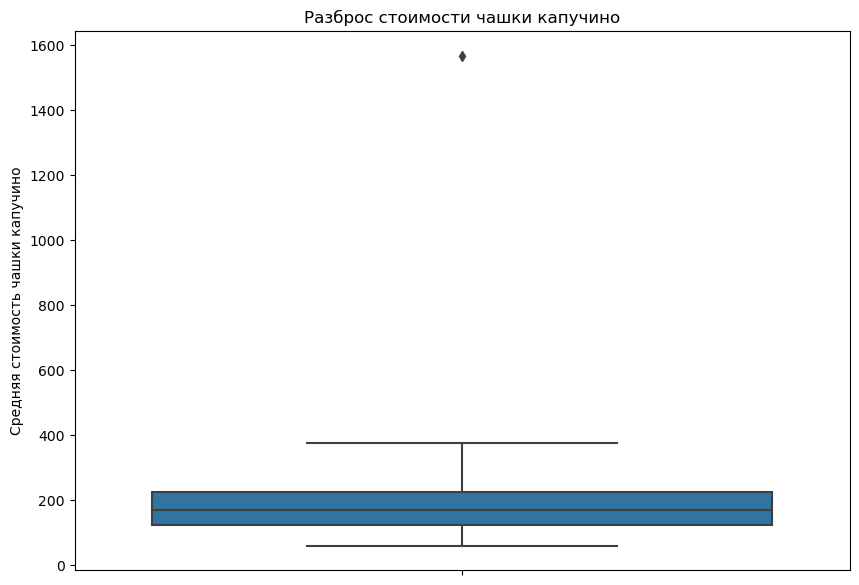

In [66]:
# построим график стоимости чашки кофе
plt.figure(figsize=(10, 7))

ax = sns.boxplot(y='middle_coffee_cup', data=coffe_cup)

plt.title('Разброс стоимости чашки капучино')
plt.ylabel('Средняя стоимость чашки капучино')

plt.show()

- Видим что есть некоторые выбросы в виде дорого кофе
- В основном стоимость не превышает 400 руб.
- Основаная часть около 200 рублей

Найдём среднюю стоимость чашки кофе

In [67]:
# посчитаем медианную стоимость чашки кофе

print('Средняя стоимость чашки кофе должна быть в районе', coffe_cup['middle_coffee_cup'].median(), 'рублей')

Средняя стоимость чашки кофе должна быть в районе 169.0 рублей


**Промежуточный итог:**
- Всего в датасете представлено 1413 кофейн
- Большоая часть находится в цетральном административном округе, что говорит о высокой конкурценции и вероятно высоком спросе
- Меньше всего - в Северо-Западном административном округе
- Круглосуточных кофейн - 59 штук
- Самые высокие рейтинги в Центральном и Северо-Западном административных округах
- Самые низкие - Западный административных округ
- Чашка капучино стоит не больше 400 руб.
- Среднее значение и рекомендованное значение 169 руб.

### <a id='вывод'>5. Вывод и рекомендации</a>

Свои выводы и рекомендации я строил исходя из последнего пункта, где речь шла об открытии кофейни

- Наиболее распротранённые заведения в Москве - кофейни, можно *рекомендовать открыть кофейню*
- Сетевых кофеин больше чем несетевых, поэтому *стоит подумать о партнёрстве с существующей сетью или открыть собственную сеть*
- Для кофейни характерно среднее количество посадочных мест, что говорит о необходимости помещения с достаточной площадью
- Больше всего заведений в Центральном административном округе. Тут стоит ожидать высокую конкуренцию
- Кофейни имеют средний рейтинг среди всех заведений, что говорит о возможности получить высокий рейтинг и выделиться среди конкурентов
- В Восточном административном округе больше всего улиц с одним заведением, значит можно *рассмотреть этот округ для открытия кофейни*, также в этом округе не выоский рейтинги существующих кофеин, что даёт потенциал для "захвата" рынка
- Круглосуточных кофеин мало, относительно общего количества. Можно рекомендовать такой формат работы в тестовом режиме
- Чашка капучино не должна превышать 400 руб. На старте рекомендованная цена 169 рублей.

Кофейни - популярная категория заведений общепита. Пользуется популярностью во всех районах города. Больше всего распротранены в Центральном административном округе, в остальных пока не сильно. Можно развивать сеть по разным районм. Круглосуточные кофейни в Москве есть, но достаточно мало. Возможно стоит в тестовом режиме запустить круглосуточное кафе и по итогам теста принимать решение. Рекомендованная цена чашки капучино около 170 рублей. Стоит рассмотреть для открытия Восточный административный округ.